In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import KNNImputer


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
galaxies_df = pd.read_csv('../data/asu(4).tsv',delimiter=';',skiprows=104)
galaxies_df = galaxies_df.drop([0,1])
galaxies_df = galaxies_df.drop(['l_FUV','l_Hamag','l_HImag','l_MHI','K+04'],axis=1)
galaxies_df = galaxies_df.dropna(subset=['TT'])
galaxies_df = galaxies_df[galaxies_df.TT != '  '].reset_index(drop=True)

In [4]:
print(galaxies_df.columns)
galaxies_df.describe(include='all')

Index(['_RAJ2000', '_DEJ2000', 'Name', 'Nd', 'RAJ2000', 'DEJ2000', 'a26',
       'FUV', 'Bmag', 'Hamag', 'Kmag', 'HImag', 'W50', 'TT', 'Mcl', 'Tdw',
       'HRV', 'Dist', 'A26', 'i', 'vAmp', '<Bmu>', 'M26', 'MHI', 'Vlg', 'Ti5',
       'SimbadName'],
      dtype='object')


,_RAJ2000,_DEJ2000,Name,Nd,RAJ2000,DEJ2000,a26,FUV,Bmag,Hamag,...,Dist,A26,i,vAmp,<Bmu>,M26,MHI,Vlg,Ti5,SimbadName
count,868,868,868,868,868,868,868,868,868,868,...,868,868,868,868,868,868,868,868,868,855
unique,868,867,868,7,868,867,242,472,424,356,...,394,549,76,136,77,349,348,518,78,855
top,000.093750,+47.409167,UGC12894,8,00 00 22.5,+47 24 33,0.85,,18.00,,...,10.40,,90,,24.1,,,,-0.1,UGC12894
freq,1,2,1,224,1,2,15,152,17,373,...,45,7,91,265,42,265,134,108,32,1


### Response Variable:

TT: Morphological type (response variable)


### Predictors

a26: Major angular diameter

FUV: Far UV

Bmag: Apparent integral b-band magnitude

Hamag: Integral H-$\alpha$ line emission magnitude

Kmag: K-band magnitude

HImag: HI 21cm line magnitude

W50: HI Line width at 50% level from maximum

Mcl: Dwarf galaxy morphology

Tdw: Dwarf galaxy surface brightness morphology

HRV: Heliocentric radial velocity

Dist: linear distance to galaxy from the sun (heiocentric)

A26: major linear diameter

i: inclination of galaxy from the face on

vAmp: amplitude of rotational velocity

Bmu: average b-band surface brightness

M26: log-mass with Holmberg radius

MHI: log-Hydrogen mass

Vlg: local group radial velocity

Ti5: tidal index

SimbadName: designation understandable by the Simbad database


# Data Imputation

# Organize the Predictors and the Response Variables

In [5]:
predictors = ['a26', 'FUV', 'Bmag', 'Hamag', 'Kmag', 'HImag', 'W50', 'Mcl', 'Tdw', 'HRV', 'Dist', 'A26', 'i', 'vAmp', '<Bmu>', 'M26', 'MHI', 'Vlg', 'Ti5']
response = ['TT']
response_dwarf = ['Mcl']

predictors_df = galaxies_df[predictors]
response_df = galaxies_df[response]
response_df_dwarf = galaxies_df[response_dwarf]

# Data Imputation

In [14]:
quant_preds = ['a26', 'FUV', 'Bmag', 'Hamag', 'Kmag', 'HImag', 'W50', 'HRV', 'Dist', 'A26', 'i', 'vAmp', '<Bmu>', 'M26', 'MHI', 'Vlg', 'Ti5']
quant_preds_df = predictors_df[quant_preds]

# strip the columns of whitespace
for col in quant_preds:
    quant_preds_df[col] = quant_preds_df[col].apply(lambda x: float(x.strip()) if (isinstance(x, str) and x.strip() != '') else np.nan)

print(len(quant_preds_df.a26))
# 1. Drop rows with more than half NaN values
half_col_count = len(quant_preds_df.columns) / 2
df_dropped = quant_preds_df.dropna(thresh=half_col_count)

print(len(df_dropped.a26))

# 2. Impute remaining NaN values with kNN
imputer = KNNImputer()
numerical_cols = df_dropped.select_dtypes(include=['float64', 'int64']).columns
df_dropped[numerical_cols] = imputer.fit_transform(df_dropped[numerical_cols])

quant_preds_df = df_dropped


868
860


/var/folders/b7/7r72r1kn6x596_mb7pz6xxfc0000gn/T/ipykernel_73943/3416409346.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quant_preds_df[col] = quant_preds_df[col].apply(lambda x: float(x.strip()) if (isinstance(x, str) and x.strip() != '') else np.nan)
/var/folders/b7/7r72r1kn6x596_mb7pz6xxfc0000gn/T/ipykernel_73943/3416409346.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dropped[numerical_cols] = imputer.fit_transform(df_dropped[numerical_cols])


# Massive Pairplot (17 x 17)

/Users/johndinovi/micromamba/envs/cs109a/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


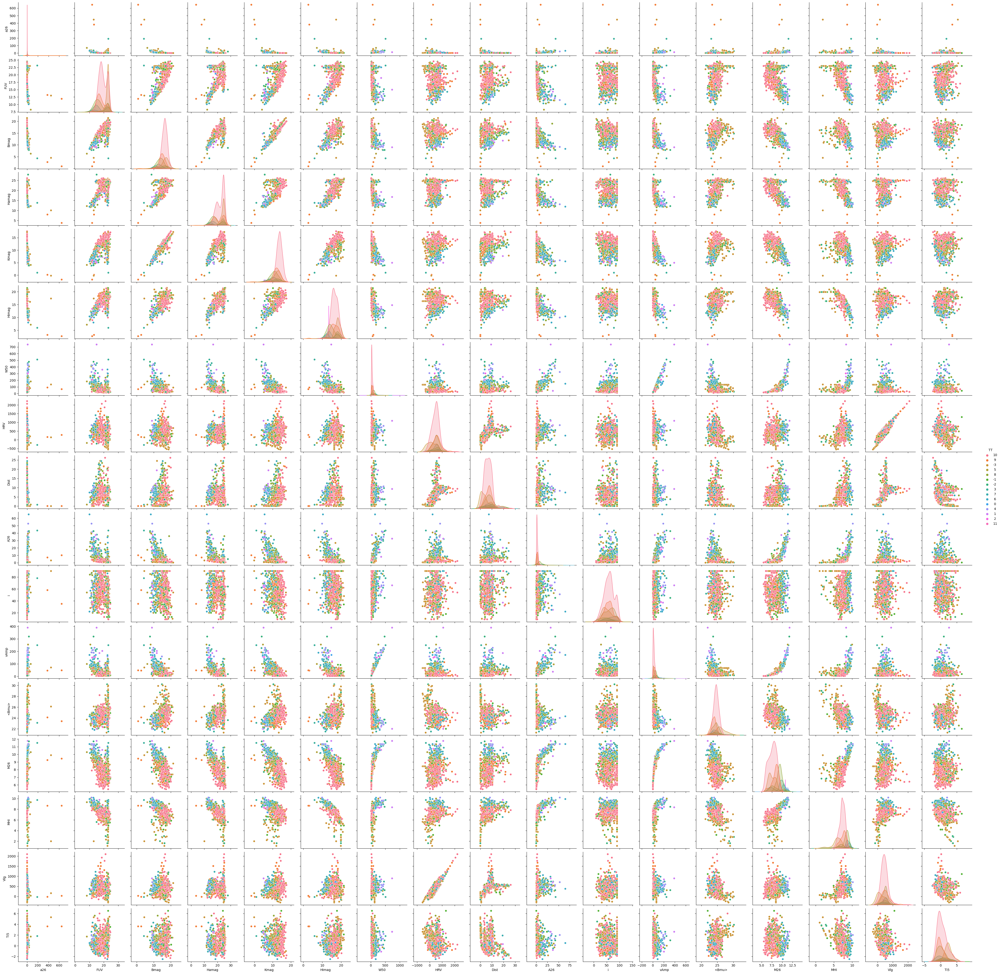

In [15]:
sns.pairplot(pd.concat([quant_preds_df, response_df], axis=1), x_vars=quant_preds, y_vars=quant_preds, hue='TT')

### Notes from Plot Above:

* HRV and VLG highly correlated because both radial velocities. Will drop HRV because it is heliocentric and thus less intrinsic to the galaxy
* 'mag' values are correlated, which we expect since it refers to the brightness of the galaxy
* Going to drop lowercase 'a26' because it is angular diameter opposed to physical diameter
* 'i' should be irrlevant for predicting type
* 'FUV' and 'M26' are correlated, which is expected

# Plots for the Notes Above

### Vlg vs. HRV

Text(0, 0.5, 'Vlg')

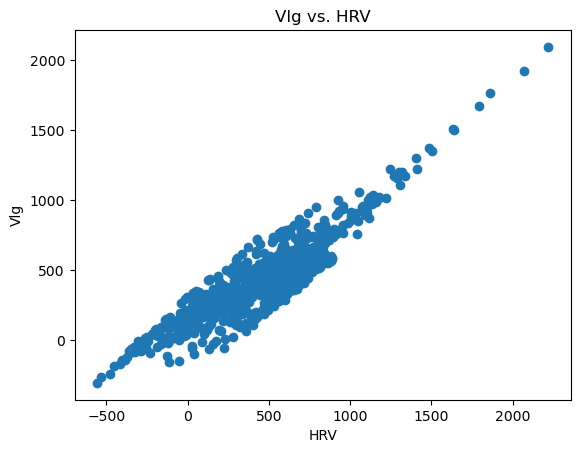

In [114]:
plt.scatter(quant_preds_df['HRV'], quant_preds_df['Vlg'])
plt.title('Vlg vs. HRV')
plt.xlabel('HRV')
plt.ylabel('Vlg')

### HImag vs. Kmag

Text(0, 0.5, 'HImag')

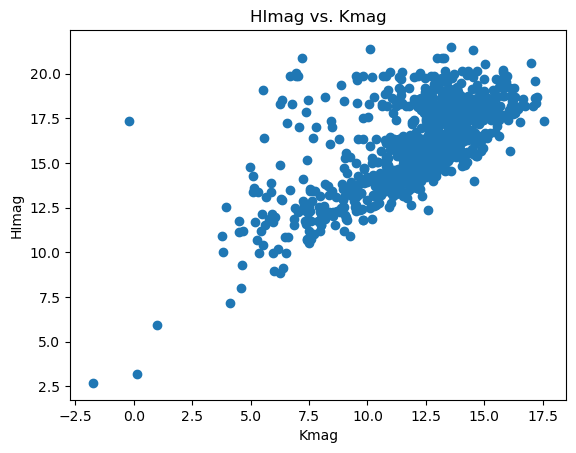

In [115]:
plt.scatter(quant_preds_df['Kmag'], quant_preds_df['HImag'])
plt.title('HImag vs. Kmag')
plt.xlabel('Kmag')
plt.ylabel('HImag')

### FUV vs. M26

Text(0, 0.5, 'FUV')

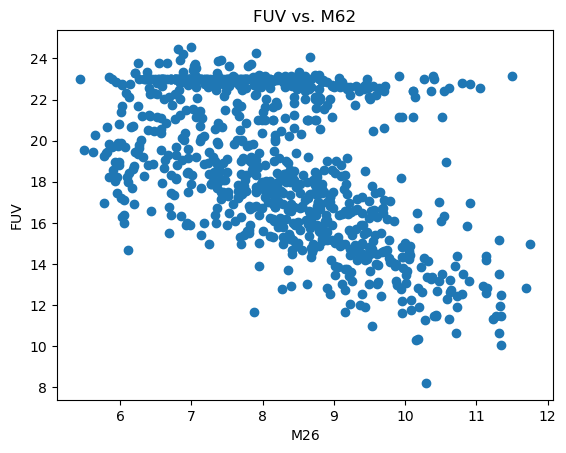

In [116]:
plt.scatter(quant_preds_df[['M26']], quant_preds_df[['FUV']])
plt.title("FUV vs. M62")
plt.xlabel('M26')
plt.ylabel('FUV')

### Visualization of How Useless 'i' is

/Users/johndinovi/micromamba/envs/cs109a/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


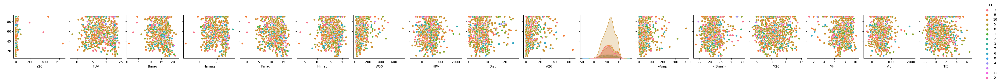

In [117]:
sns.pairplot(pd.concat([quant_preds_df, response_df], axis=1), y_vars=['i'], x_vars=quant_preds, hue='TT')

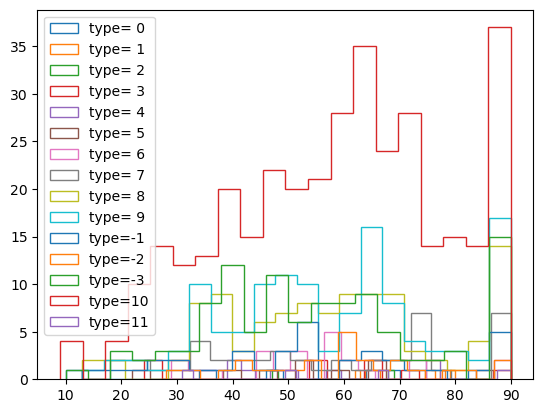

(array([ 12.,  32.,  56., 105., 102., 108., 149., 116.,  56., 124.]),
 array([ 9. , 17.1, 25.2, 33.3, 41.4, 49.5, 57.6, 65.7, 73.8, 81.9, 90. ]),
 <BarContainer object of 10 artists>)

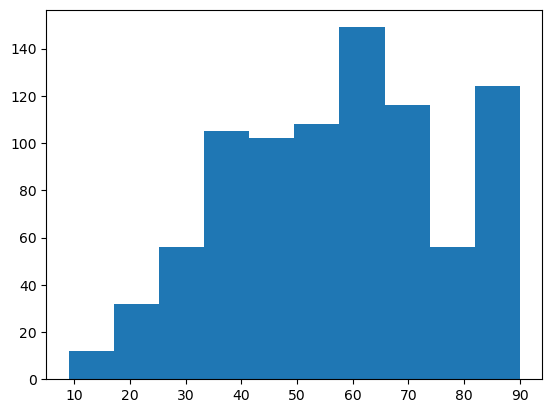

In [118]:
all_df = pd.concat([quant_preds_df, response_df], axis=1)

for val in np.unique(response_df.TT.to_numpy()):
    plt.hist(all_df.i[all_df.TT == val].dropna(), histtype='step', bins=20, label=f"type={val}")

plt.legend()
plt.show()

plt.hist(quant_preds_df[['i']])

# Data Imputation

/var/folders/b7/7r72r1kn6x596_mb7pz6xxfc0000gn/T/ipykernel_73943/4036466847.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dropped[numerical_cols] = imputer.fit_transform(df_dropped[numerical_cols])


# Basic PCA

In [127]:
mydict = {
 -3: '#1f77b4',
 -2: '#ff7f0e',
 -1: '#2ca02c',
  0: '#d62728',
  1: '#9467bd',
  2: '#8c564b',
  3: '#e377c2',
  4: '#7f7f7f',
  5: '#bcbd22',
  6: '#17becf',
  7: 'red',
  8: 'blue',
  9: 'green',
 10: 'orange',
 11: 'black'
}

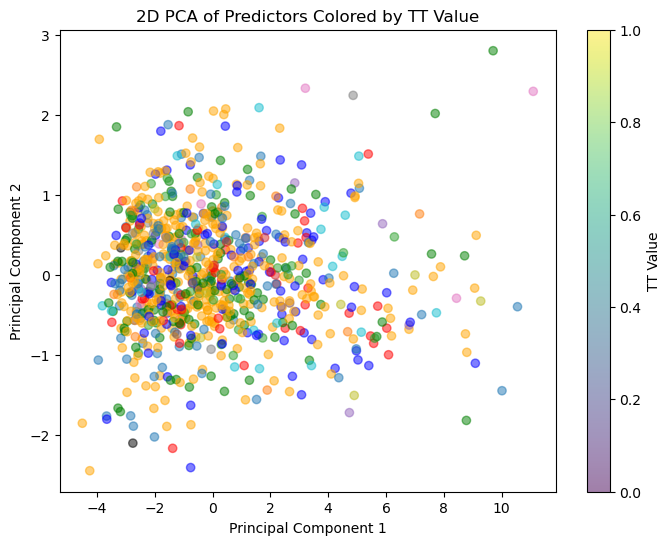

In [158]:
# Standardize the data
scaler = StandardScaler()
predictors_standardized = scaler.fit_transform(quant_preds_df)

# Apply PCA
pca = PCA(n_components=10)
principal_components = pca.fit_transform(predictors_standardized)

# Create a DataFrame with the PCA results
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10'])
pca_df['TT'] = response_df.TT
cols = [mydict[float(t)] for t in pca_df.TT]



# Plotting
plt.figure(figsize=(8, 6))
scatter = plt.scatter(pca_df['PC1'], pca_df['PC8'], c=cols, alpha=0.5)
plt.title('2D PCA of Predictors Colored by TT Value')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(scatter, label='TT Value')
plt.show()


## Notes From Uninformative PCA

* Difficult to find 2 principle components that show the data are grouped
* We believe that this might have to do with how the dimensions of the predictors need to be orthogonal, but in we have seen that many predictors are collinear



# Pairplots of Predictors That Show Clustering

/Users/johndinovi/micromamba/envs/cs109a/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


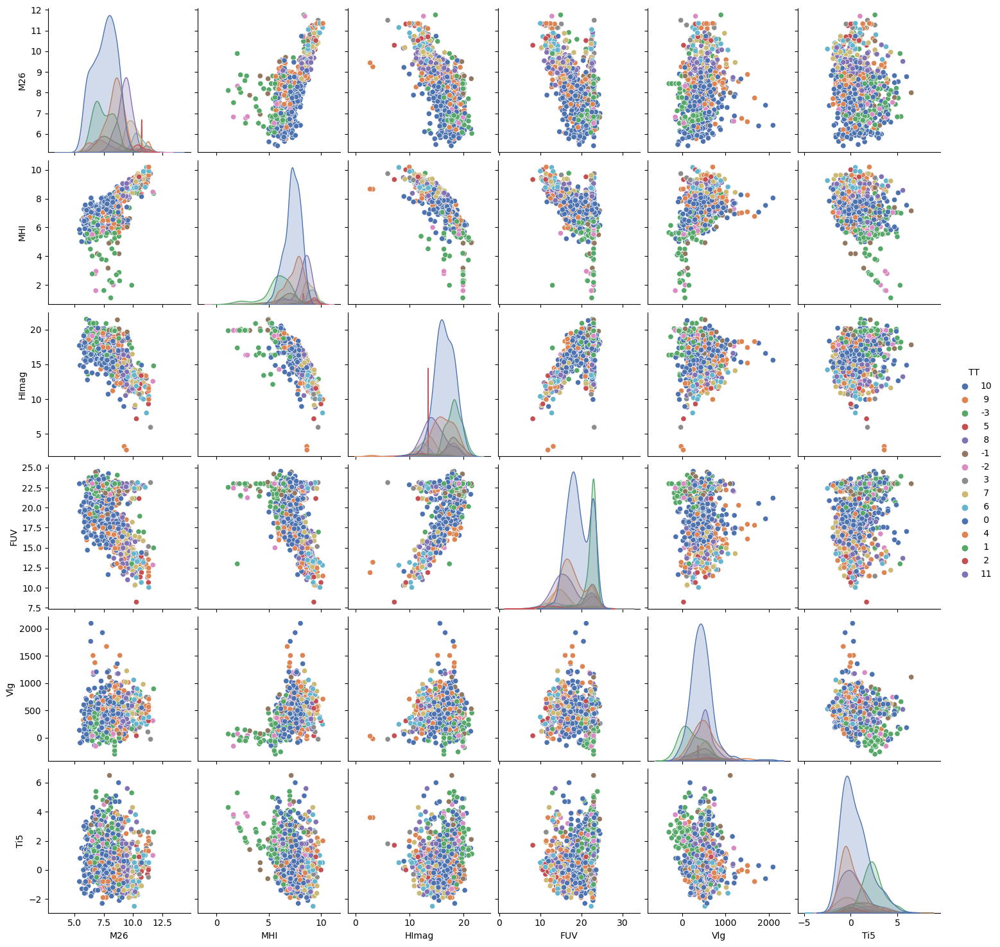

In [11]:
preds_of_interest = ['M26', 'MHI', 'HImag', 'FUV', 'Vlg', 'Ti5']

sns.pairplot(pd.concat([quant_preds_df, response_df], axis=1), x_vars=preds_of_interest, y_vars=preds_of_interest, hue='TT', palette="deep")

In [8]:
concatted = pd.concat([quant_preds_df, response_df], axis=1)

concatted['gal_type'] = 0

concatted['gal_type'][concatted.TT.astype(int) <= -1] = 'lenticular'
concatted['gal_type'][(concatted.TT.astype(int) >= 0) & (concatted.TT.astype(int) <= 7)] = 'spiral'
concatted['gal_type'][concatted.TT.astype(int) >= 8] = 'irregular'


/var/folders/b7/7r72r1kn6x596_mb7pz6xxfc0000gn/T/ipykernel_73943/229526369.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  concatted['gal_type'][concatted.TT.astype(int) <= -1] = 'lenticular'


/Users/johndinovi/micromamba/envs/cs109a/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


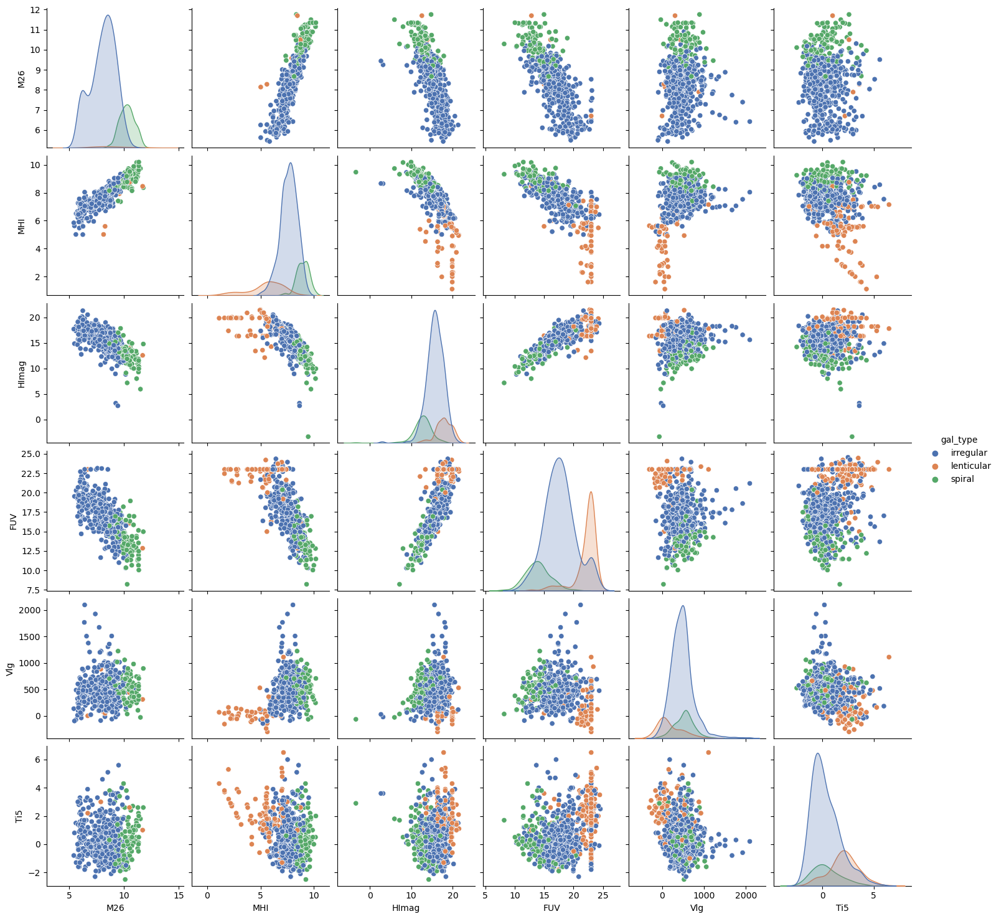

In [193]:
sns.pairplot(concatted, x_vars=preds_of_interest, y_vars=preds_of_interest, hue='gal_type', palette="deep")

KeyError: 'Mcl'

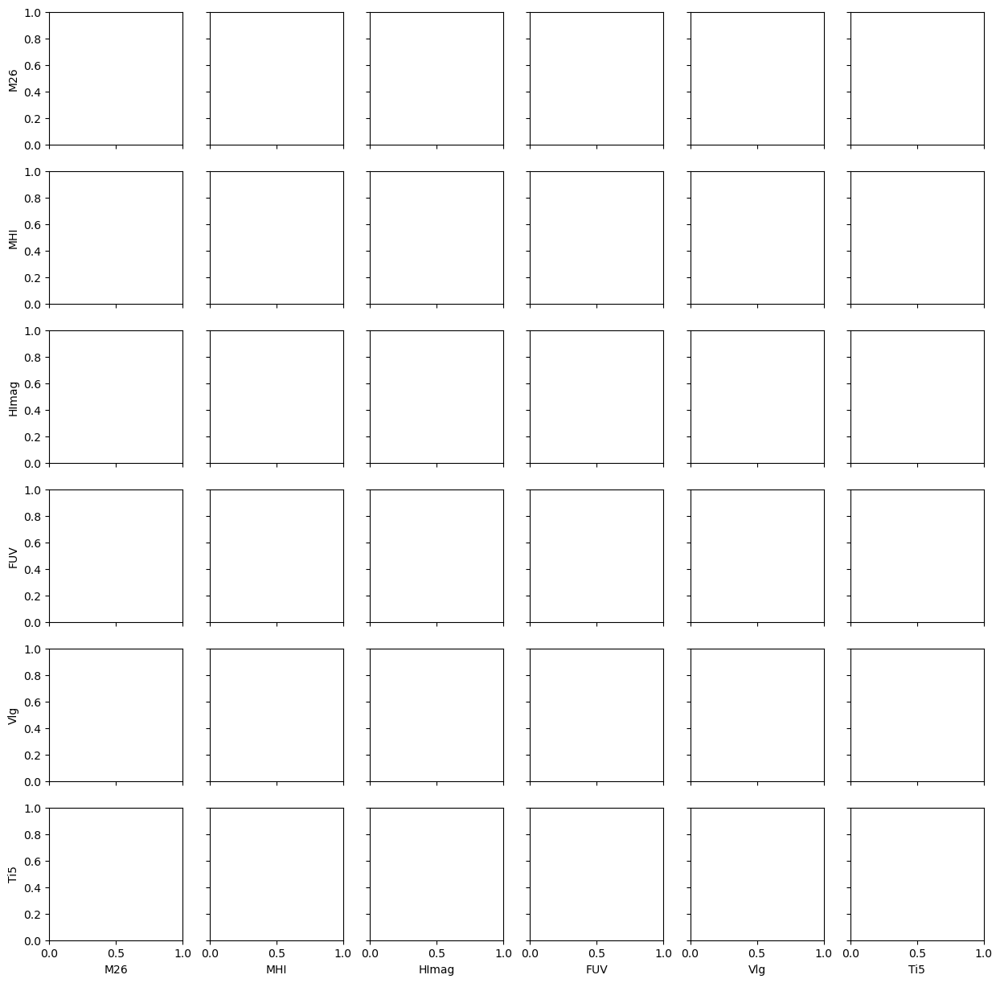

In [12]:
concatted_dwarf = 

sns.pairplot(concatted, x_vars=preds_of_interest, y_vars=preds_of_interest, hue='Mcl', palette="deep")